In [ ]:
#This part intends to predict RTLMP via using a multivariate time series LSTM model. 
#First some EDA and data preprocessing will be performed on the dataset. Then the model will learn from the train split and its performance will be evaluated based on its prediction on the test split.

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import datetime
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from pandas.plotting import scatter_matrix
from scipy import stats
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import mean_squared_error,r2_score, mean_absolute_error

In [4]:
df = pd.read_csv('timeseries_data.csv')
df.head(20)

,DATETIME,HB_NORTH (RTLMP),ERCOT (WIND_RTI),ERCOT (GENERATION_SOLAR_RT),ERCOT (RTLOAD),HOURENDING,MARKETDAY,PEAKTYPE,MONTH,YEAR
0,1/1/2017 1:00,23.3575,2155.31,-,"29,486",1,1/1/2017,OFFPEAK,JANUARY,2017
1,1/1/2017 2:00,21.4650,2313.81,-,"28,912",2,1/1/2017,OFFPEAK,JANUARY,2017
2,1/1/2017 3:00,20.7350,2587.68,-,"28,238",3,1/1/2017,OFFPEAK,JANUARY,2017
3,1/1/2017 4:00,20.2700,2748.65,-,"27,821",4,1/1/2017,OFFPEAK,JANUARY,2017
4,1/1/2017 5:00,20.1200,2757.49,-,"27,647",5,1/1/2017,OFFPEAK,JANUARY,2017
5,1/1/2017 6:00,19.7925,3032.06,-,"27,702",6,1/1/2017,OFFPEAK,JANUARY,2017
6,1/1/2017 7:00,19.7225,3823.51,-,"28,244",7,1/1/2017,WEPEAK,JANUARY,2017
7,1/1/2017 8:00,19.7375,4419.88,0.54,"28,956",8,1/1/2017,WEPEAK,JANUARY,2017
8,1/1/2017 9:00,19.2625,6009.27,87.20,"29,623",9,1/1/2017,WEPEAK,JANUARY,2017
9,1/1/2017 10:00,19.8625,5107.69,333.42,"30,678",10,1/1/2017,WEPEAK,JANUARY,2017


In [5]:
df.dtypes

DATETIME                          object
HB_NORTH (RTLMP)                 float64
ERCOT (WIND_RTI)                 float64
 ERCOT (GENERATION_SOLAR_RT)      object
 ERCOT (RTLOAD)                   object
 HOURENDING                        int64
MARKETDAY                         object
PEAKTYPE                          object
MONTH                             object
YEAR                               int64
dtype: object

In [6]:
rename_dict = {} #first rename the columns so that the space within the string will be stripped.
for elem in df.columns:
    rename_dict[elem] = elem.strip()
df.rename(columns=rename_dict, inplace=True)

def handle_str(s): #This function converts strings of numerical data containing comma, '-', and nan into float. 
    if type(s) == str and s.strip() == '-': 
        return 0
    elif type(s) == str:
        return float(s.replace(',','').strip())
    return 0
df["ERCOT (GENERATION_SOLAR_RT)"] = df["ERCOT (GENERATION_SOLAR_RT)"].apply(handle_str)
df['ERCOT (RTLOAD)'] = df['ERCOT (RTLOAD)'].apply(handle_str)

In [7]:
n = len(df)
df_for_train, df_for_test = df[:int(n*0.75)], df[int(n*0.75):] #split the data into a train and test split.
df_for_train.tail(10)

,DATETIME,HB_NORTH (RTLMP),ERCOT (WIND_RTI),ERCOT (GENERATION_SOLAR_RT),ERCOT (RTLOAD),HOURENDING,MARKETDAY,PEAKTYPE,MONTH,YEAR
11230,4/14/2018 0:00,14.5825,14766.14,0.00,37533.0,24,4/13/2018,OFFPEAK,APRIL,2018
11231,4/14/2018 1:00,17.2075,13760.07,0.00,34317.0,1,4/14/2018,OFFPEAK,APRIL,2018
11232,4/14/2018 2:00,14.7425,13648.01,0.00,31974.0,2,4/14/2018,OFFPEAK,APRIL,2018
11233,4/14/2018 3:00,14.3850,13242.01,0.00,30064.0,3,4/14/2018,OFFPEAK,APRIL,2018
11234,4/14/2018 4:00,12.7650,12936.79,0.00,28869.0,4,4/14/2018,OFFPEAK,APRIL,2018
11235,4/14/2018 5:00,11.6300,12923.94,0.00,28393.0,5,4/14/2018,OFFPEAK,APRIL,2018
11236,4/14/2018 6:00,13.8125,12893.90,0.00,28652.0,6,4/14/2018,OFFPEAK,APRIL,2018
11237,4/14/2018 7:00,16.6950,12999.68,0.00,29640.0,7,4/14/2018,WEPEAK,APRIL,2018
11238,4/14/2018 8:00,18.0750,12127.96,33.67,30676.0,8,4/14/2018,WEPEAK,APRIL,2018
11239,4/14/2018 9:00,18.9100,11614.72,457.54,32187.0,9,4/14/2018,WEPEAK,APRIL,2018


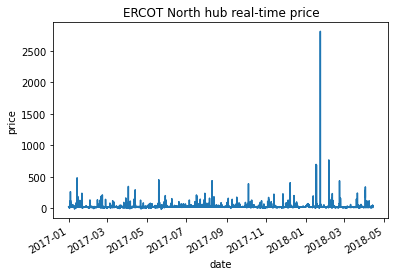

In [8]:
#First take a look at the RTLMP and see if there is any patterns.
plt.plot(pd.to_datetime(df_for_train['DATETIME']), df_for_train['HB_NORTH (RTLMP)'])
plt.gcf().autofmt_xdate()
plt.title('ERCOT North hub real-time price')
plt.xlabel('date')
plt.ylabel('price');

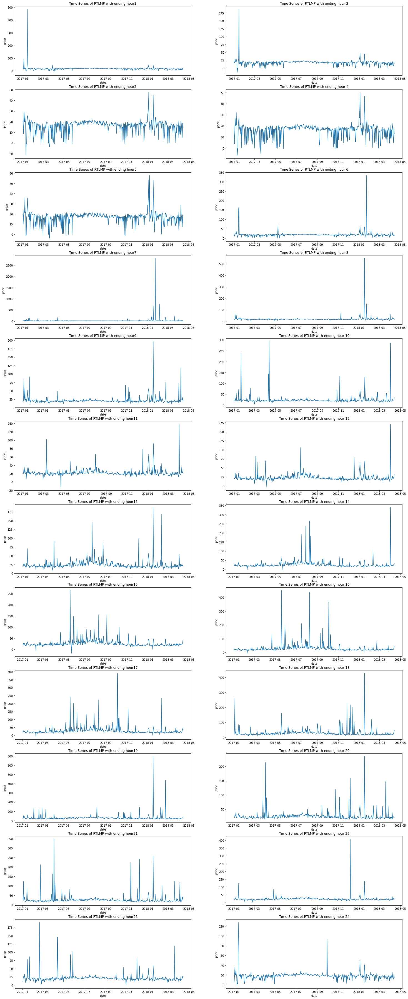

In [9]:
#Plot RTLMP against ending hours. Some RTLMP with different ending hours show similar graphs. For example, RTLMP with ending hour 3, 4, and 5 look similar.
fig, axes = plt.subplots(12, 2)
fig.set_size_inches(25,65)
for i in range(0, 12):
    axes[i,0].plot(pd.to_datetime(df_for_train[df_for_train.HOURENDING == 2*i+1]['DATETIME']),\
                   df_for_train[df_for_train.HOURENDING == 2*i+1]['HB_NORTH (RTLMP)'])
    axes[i,0].set_title('Time Series of RTLMP with ending hour' + str(2*i+1))
    axes[i,0].set_xlabel('date')
    axes[i,0].set_ylabel('price')
    axes[i,1].plot(pd.to_datetime(df_for_train[df_for_train.HOURENDING == 2*i+2]['DATETIME']),\
                   df_for_train[df_for_train.HOURENDING == 2*i+2]['HB_NORTH (RTLMP)'])
    axes[i,1].set_title('Time Series of RTLMP with ending hour ' + str(2*i+2))
    axes[i,1].set_xlabel('date')
    axes[i,1].set_ylabel('price')

In [10]:
#Taking a look at the months in train and test split. The train set has all 12 months while the test set has data from January to April. 
print(df_for_train[df_for_train.YEAR == 2017].MONTH.value_counts)
print(df_for_train[df_for_train.YEAR == 2018].MONTH.value_counts)

<bound method IndexOpsMixin.value_counts of 0        JANUARY
1        JANUARY
2        JANUARY
3        JANUARY
4        JANUARY
          ...   
8755    DECEMBER
8756    DECEMBER
8757    DECEMBER
8758    DECEMBER
8759    DECEMBER
Name: MONTH, Length: 8760, dtype: object>
<bound method IndexOpsMixin.value_counts of 8760     JANUARY
8761     JANUARY
8762     JANUARY
8763     JANUARY
8764     JANUARY
          ...   
11235      APRIL
11236      APRIL
11237      APRIL
11238      APRIL
11239      APRIL
Name: MONTH, Length: 2480, dtype: object>


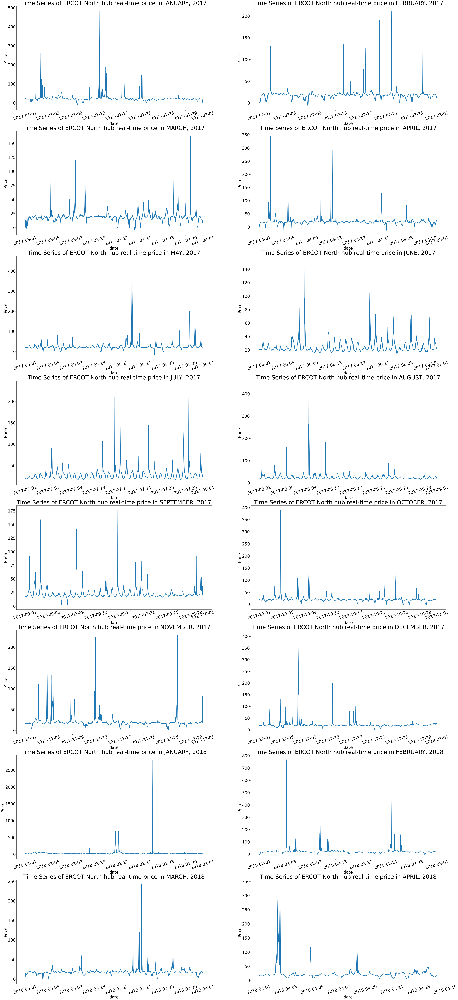

In [11]:
#Plot a graph of RTLMP against different months of different years. In this case, the data has years 2017 and 2018.
fig, axes = plt.subplots(8, 2)
fig.set_size_inches(75,175)
months = ('JANUARY', 'FEBRUARY', "MARCH", "APRIL", "MAY", "JUNE", "JULY", "AUGUST", "SEPTEMBER", "OCTOBER", "NOVEMBER", "DECEMBER")
years = (2017, 2018)
for i in range(0, 16):
    year = 2017
    if i >= 12:
        year = 2018
    df_filter = df_for_train[(df_for_train.MONTH == months[i%12]) & (df_for_train.YEAR == year)]
    axes[i//2,i%2].plot(pd.to_datetime(df_filter['DATETIME']), df_filter['HB_NORTH (RTLMP)'],linewidth=5)
    axes[i//2,i%2].set_title('Time Series of ERCOT North hub real-time price in ' + str(months[i%12]) + ', ' + str(year), fontsize = 55)
    axes[i//2,i%2].set_xlabel('date', fontsize = 40)
    axes[i//2,i%2].set_ylabel('Price', fontsize = 40)
    axes[i//2,i%2].tick_params(axis='x', labelsize=40, labelrotation = 15)
    axes[i//2,i%2].tick_params(axis='y', labelsize=40)

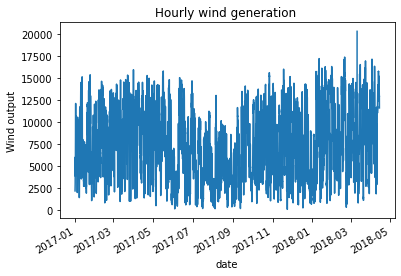

In [12]:
#Plot the hourly wind generation against the date.
plt.plot(pd.to_datetime(df_for_train['DATETIME']), df_for_train['ERCOT (WIND_RTI)'])
plt.gcf().autofmt_xdate()
plt.title('Hourly wind generation ')
plt.xlabel('date')
plt.ylabel('Wind output');

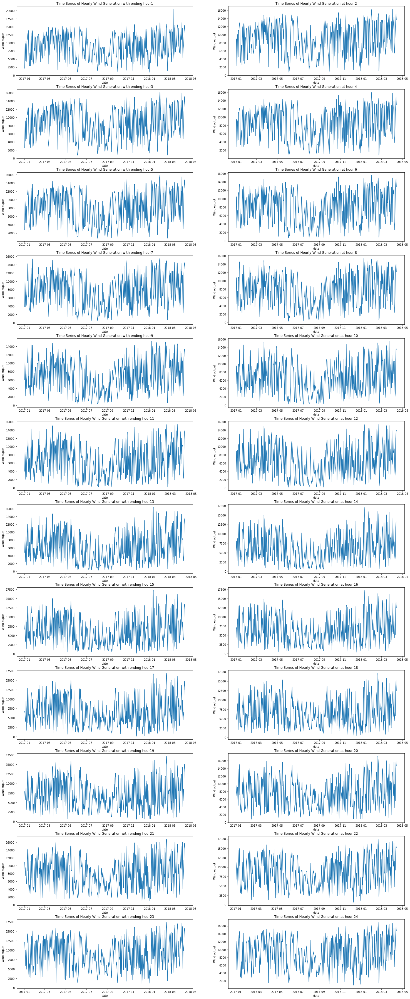

In [13]:
#See if there is any patterns from the hourly wind generation. The graphs look alike for all ending hours.
fig, axes = plt.subplots(12, 2)
fig.set_size_inches(25,65)
for i in range(0, 12):
    axes[i,0].plot(pd.to_datetime(df_for_train[df_for_train.HOURENDING == 2*i+1]['DATETIME']),\
                   df_for_train[df_for_train.HOURENDING == 2*i+1]['ERCOT (WIND_RTI)'])
    axes[i,0].set_title('Time Series of Hourly Wind Generation with ending hour' + str(2*i+1))
    axes[i,0].set_xlabel('date')
    axes[i,0].set_ylabel('Wind ouput')
    axes[i,1].plot(pd.to_datetime(df_for_train[df_for_train.HOURENDING == 2*i+2]['DATETIME']),\
                   df_for_train[df_for_train.HOURENDING == 2*i+2]['ERCOT (WIND_RTI)'])
    axes[i,1].set_title('Time Series of Hourly Wind Generation at hour ' + str(2*i+2))
    axes[i,1].set_xlabel('date')
    axes[i,1].set_ylabel('Wind output')

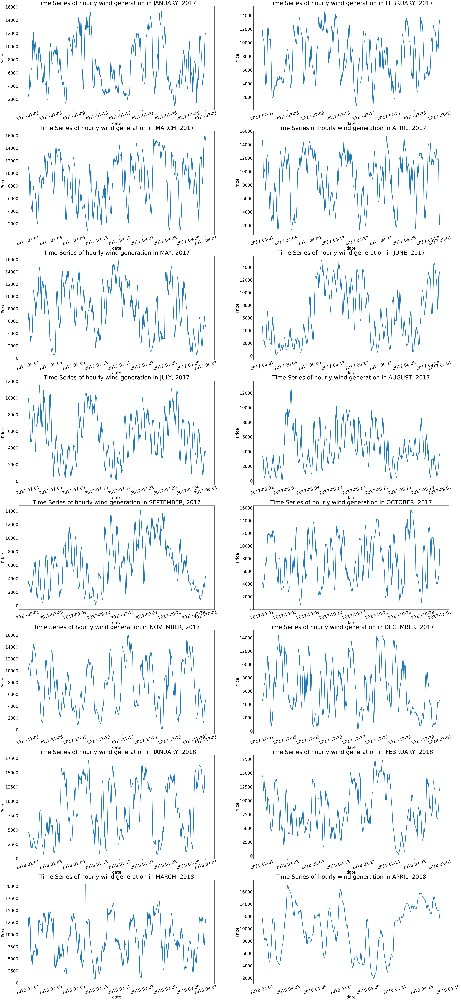

In [18]:
#Taking a look at the wind generation in different months of different years.
fig, axes = plt.subplots(8, 2)
fig.set_size_inches(75,175)
months = ('JANUARY', 'FEBRUARY', "MARCH", "APRIL", "MAY", "JUNE", "JULY", "AUGUST", "SEPTEMBER", "OCTOBER", "NOVEMBER", "DECEMBER")
years = (2017, 2018)
for i in range(0, 16):
    year = 2017
    if i >= 12:
        year = 2018
    df_filter = df_for_train[(df_for_train.MONTH == months[i%12]) & (df_for_train.YEAR == year)]
    axes[i//2,i%2].plot(pd.to_datetime(df_filter['DATETIME']), df_filter['ERCOT (WIND_RTI)'],linewidth=5)
    axes[i//2,i%2].set_title('Time Series of hourly wind generation in ' + str(months[i%12]) + ', ' + str(year), fontsize = 55)
    axes[i//2,i%2].set_xlabel('date', fontsize = 40)
    axes[i//2,i%2].set_ylabel('Price', fontsize = 40)
    axes[i//2,i%2].tick_params(axis='x', labelsize=40, labelrotation = 15)
    axes[i//2,i%2].tick_params(axis='y', labelsize=40)

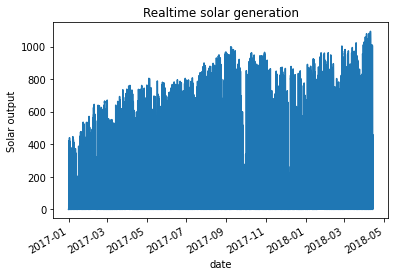

In [13]:
#Repeat the same procedures for solar generation.
plt.plot(pd.to_datetime(df_for_train['DATETIME']), df_for_train['ERCOT (GENERATION_SOLAR_RT)'])
plt.gcf().autofmt_xdate()
plt.title('Realtime solar generation')
plt.xlabel('date')
plt.ylabel('Solar output');

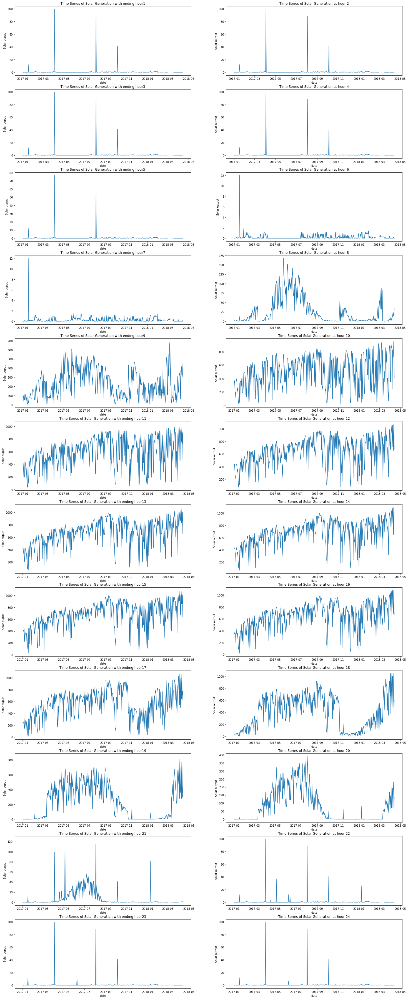

In [14]:
fig, axes = plt.subplots(12, 2)
fig.set_size_inches(25,65)
for i in range(0, 12):
    axes[i,0].plot(pd.to_datetime(df_for_train[df_for_train.HOURENDING == 2*i+1]['DATETIME']),\
                   df_for_train[df_for_train.HOURENDING == 2*i+1]['ERCOT (GENERATION_SOLAR_RT)'])
    axes[i,0].set_title('Time Series of Solar Generation with ending hour' + str(2*i+1))
    axes[i,0].set_xlabel('date')
    axes[i,0].set_ylabel('Solar ouput')
    axes[i,1].plot(pd.to_datetime(df_for_train[df_for_train.HOURENDING == 2*i+2]['DATETIME']),\
                   df_for_train[df_for_train.HOURENDING == 2*i+2]['ERCOT (GENERATION_SOLAR_RT)'])
    axes[i,1].set_title('Time Series of Solar Generation at hour ' + str(2*i+2))
    axes[i,1].set_xlabel('date')
    axes[i,1].set_ylabel('Solar output')

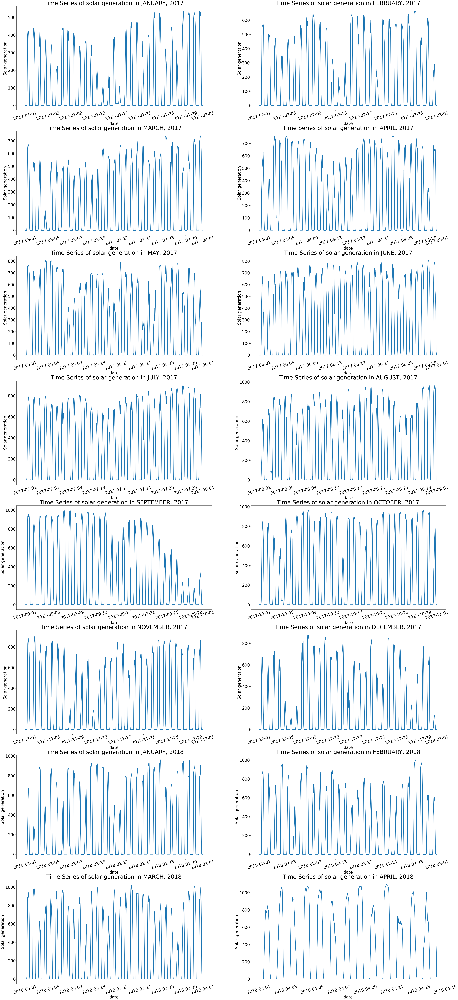

In [15]:
fig, axes = plt.subplots(8, 2)
fig.set_size_inches(75,175)
months = ('JANUARY', 'FEBRUARY', "MARCH", "APRIL", "MAY", "JUNE", "JULY", "AUGUST", "SEPTEMBER", "OCTOBER", "NOVEMBER", "DECEMBER")
years = (2017, 2018)
for i in range(16):
    year = 2017
    if i >= 12:
        year = 2018
    df_filter = df_for_train[(df_for_train.MONTH == months[i%12]) & (df_for_train.YEAR == year)]
    axes[i//2,i%2].plot(pd.to_datetime(df_filter['DATETIME']), df_filter['ERCOT (GENERATION_SOLAR_RT)'],linewidth=5)
    axes[i//2,i%2].set_title('Time Series of solar generation in ' + str(months[i%12]) + ', ' + str(year), fontsize = 55)
    axes[i//2,i%2].set_xlabel('date', fontsize = 40)
    axes[i//2,i%2].set_ylabel('Solar generation', fontsize = 40)
    axes[i//2,i%2].tick_params(axis='x', labelsize=40, labelrotation = 15)
    axes[i//2,i%2].tick_params(axis='y', labelsize=40)

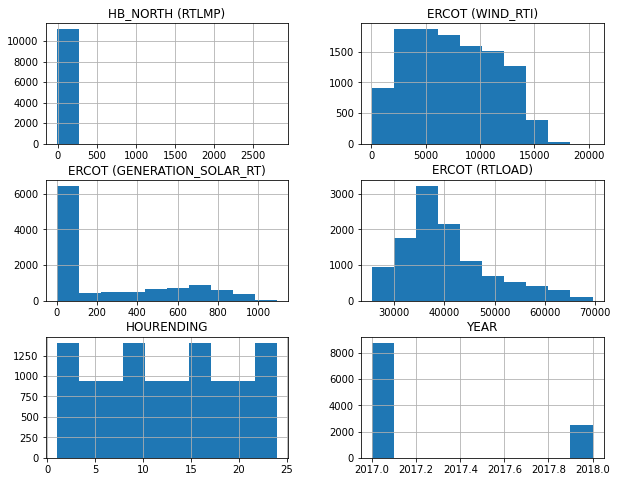

In [16]:
#Taking a look at the distribution of numerical data.
df_for_train.hist(sharex=False, sharey=False, figsize=(10,8));

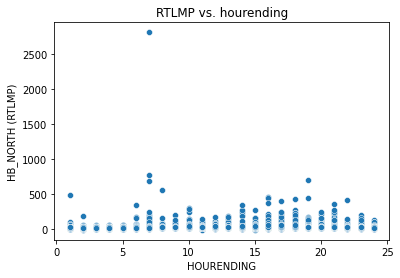

In [17]:
#Taking a look at whether ending hours have an effect of RTLMP. In this case, it doesn't seem to have one.
plt.figure(figsize=(6,4)) 
plt.title("RTLMP vs. hourending") 
sns.scatterplot(x='HOURENDING',y='HB_NORTH (RTLMP)',data=df_for_train);

In [18]:
#Look at the peak types.
df_for_train['PEAKTYPE'].value_counts()

WDPEAK     5248
OFFPEAK    3749
WEPEAK     2243
Name: PEAKTYPE, dtype: int64

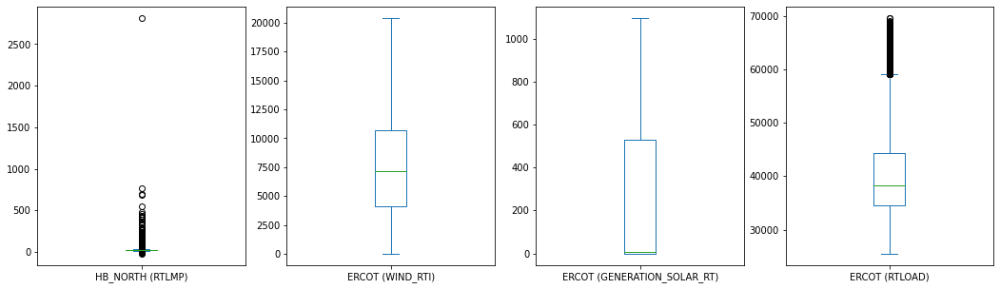

In [19]:
#Taking a look at the box plot distribution of numerical data.
df_for_train.loc[:, ~df_for_train.columns.isin(['YEAR', 'HOURENDING'])].plot(kind='box', subplots=True, sharex=False, sharey=False, figsize=(18,5));

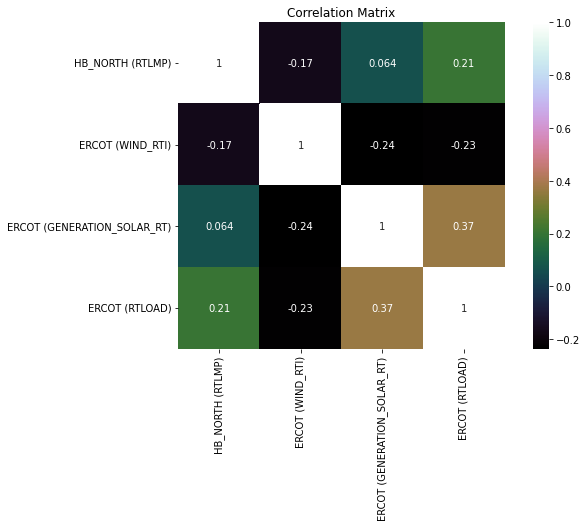

In [20]:
#Taking a look at the correlation matrix for numerical columns. The features don't seem to have strong correlations.
plt.figure(figsize=(10,6))
plt.title("Correlation Matrix")
sns.heatmap(df_for_train.loc[:, ~df_for_train.columns.isin(['YEAR', 'HOURENDING'])].corr(), vmax=1, square=True,annot=True,cmap='cubehelix');

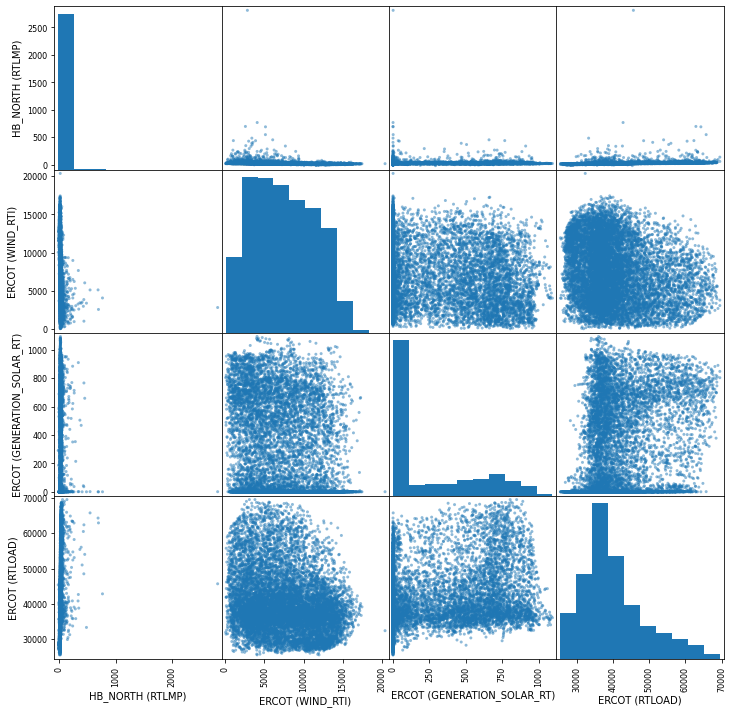

In [21]:
#Taking a look at the scatter plot of numerical columns.
scatter_matrix(df_for_train.loc[:, ~df_for_train.columns.isin(['YEAR', 'HOURENDING'])], figsize=(12,12));

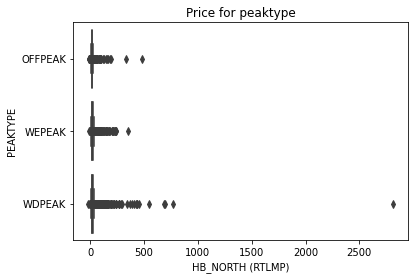

In [22]:
#Taking a look at whether peak type has an effect on RTLMP. Based on the graph, it doesn't seem to have one.
plt.figure(figsize=(6,4))
plt.title('Price for peaktype') 
sns.boxplot(y="PEAKTYPE", x="HB_NORTH (RTLMP)", data=df_for_train, orient="h");

In [23]:
df_for_train['PEAKTYPE'].isna().any()

False

In [24]:
#The graphs above show some extreme values deviating a lot from the majority of observations. Therefore, some preprocessing are performed on numerical columns.
#The code below separate df_for_train into numerical parts and the rest. Since ERCOT (WIND_RTI) has some nan observations, data imputation is applied by
#replacing those by the median. 
df_for_train_numerical = df_for_train.loc[:, ~df_for_train.columns.isin(['DATETIME','YEAR', 'HOURENDING','MONTH','PEAKTYPE','MARKETDAY'])]
print(df_for_train_numerical.loc[pd.isna(df_for_train_numerical["ERCOT (WIND_RTI)"]), :].index)
df_for_train_numerical.fillna(df_for_train_numerical.median(), inplace = True)

Int64Index([7392, 7393, 10417], dtype='int64')


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


In [25]:
#Removing outliers via Zscore method z = (x-mean)/std
z = np.abs(stats.zscore(df_for_train_numerical))
threshold = 3 #If the z score is greater than 3, the data is assumed to be an outlier and is to be removed.
print(np.where(z>3))

(array([   65,   312,   317,   337,   341,   486,   489,   786,  1062,
        1198,  1244,  1362,  2107,  2202,  2203,  2408,  2445,  2453,
        2456,  3325,  3326,  3327,  3328,  3565,  3566,  3567,  3590,
        3807,  4165,  4166,  4167,  4168,  4455,  4718,  4740,  4790,
        4791,  4792,  4813,  4814,  4815,  4816,  4817,  4837,  4838,
        4839,  4840,  4841,  4859,  4934,  4935,  4936,  4958,  4959,
        4960,  4981,  4982,  4983,  4984,  4985,  5005,  5006,  5007,
        5007,  5008,  5009,  5010,  5028,  5030,  5031,  5032,  5033,
        5201,  5292,  5293,  5294,  5295,  5318,  5319,  5320,  5341,
        5342,  5343,  5344,  5364,  5438,  5439,  5440,  5462,  5463,
        5464,  5465,  5534,  5535,  5536,  5605,  5606,  5607,  5608,
        5609,  5893,  6038,  6206,  6638,  6639,  7383,  7401,  7580,
        7913,  8177,  8178,  8179,  8180,  8181,  8321,  9030,  9132,
        9137,  9138,  9139,  9140,  9141,  9150,  9151,  9152,  9293,
        9294,  9295

In [26]:
df_for_train_numerical = df_for_train_numerical[(z<3).all(axis=1)]

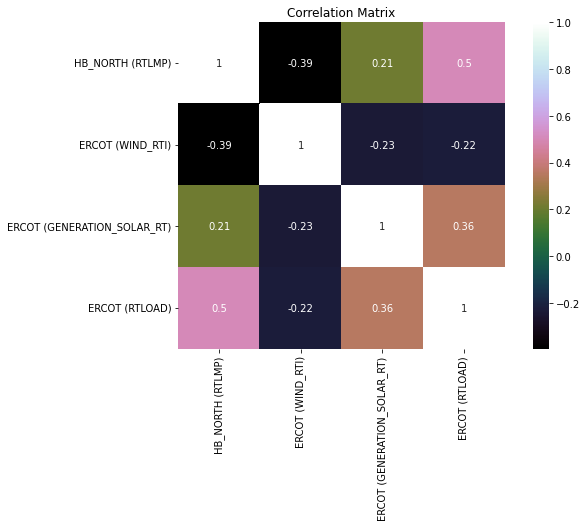

In [27]:
#Taking a look at the new correlation matrix and the scatter plot below. After removing some extreme values, the correlations seem to be stronger.
#For example, the correlation between RTLMP and RTLOAD increases from 0.21 to 0.5. Meaning that when RTLOAD increases, RTLMP tends to increase as well.
plt.figure(figsize=(10,6))
plt.title("Correlation Matrix")
sns.heatmap(df_for_train_numerical.corr(), vmax=1, square=True,annot=True,cmap='cubehelix');

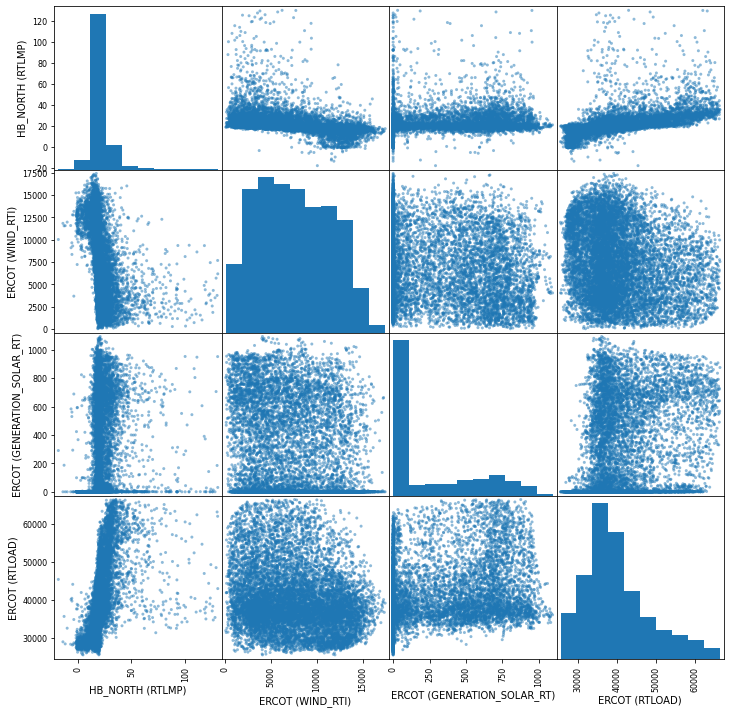

In [28]:
scatter_matrix(df_for_train_numerical, figsize=(12,12));

In [29]:
len(np.where(z>3)[0])

142

In [30]:
#Drop the indicies with observations containing outliers as well before concatenating them back.
df_for_train_rest = df_for_train[['DATETIME','YEAR', 'HOURENDING','MONTH','PEAKTYPE','MARKETDAY']]
df_for_train_rest.drop(np.where(z>3)[0], inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [31]:
#reindex the dataframes before concatenation.
index_lst = [i for i in range(len(df_for_train_numerical))]
df_for_train_rest.index = index_lst
df_for_train_numerical.index = index_lst
df_for_train = pd.concat((df_for_train_rest, df_for_train_numerical), axis=1)

In [32]:
index_lst = [i for i in range(len(df_for_train_numerical))]
df_for_train = pd.concat((df_for_train_rest.reindex(index_lst), df_for_train_numerical.reindex(index_lst)), axis=1)

In [33]:
#This part use OneHotEncoder to assign dummies to whether an obervation is in one of the peak types.
ohe = OneHotEncoder()
peaktype_array = ohe.fit_transform(df_for_train[['PEAKTYPE']]).toarray()
peaktype_labels = np.array(ohe.categories_).ravel()
peaktypes = pd.DataFrame(peaktype_array, columns=peaktype_labels)
df_for_train = pd.concat((df_for_train, peaktypes), axis=1).drop(["PEAKTYPE"], axis=1)

In [34]:
#This part use OneHotEncoder to assign dummies to whether an obervation is in one of the months.
#The same practice was attempted to apply to ending hours as well, yet the correlation is very low. So OneHotEncoder for ending hours is not performed here.
month_array = ohe.fit_transform(df_for_train[['MONTH']]).toarray()
month_labels = np.array(ohe.categories_).ravel()
month_types = pd.DataFrame(month_array, columns=month_labels)
df_for_train = pd.concat((df_for_train, month_types), axis=1).drop(["MONTH"], axis=1)

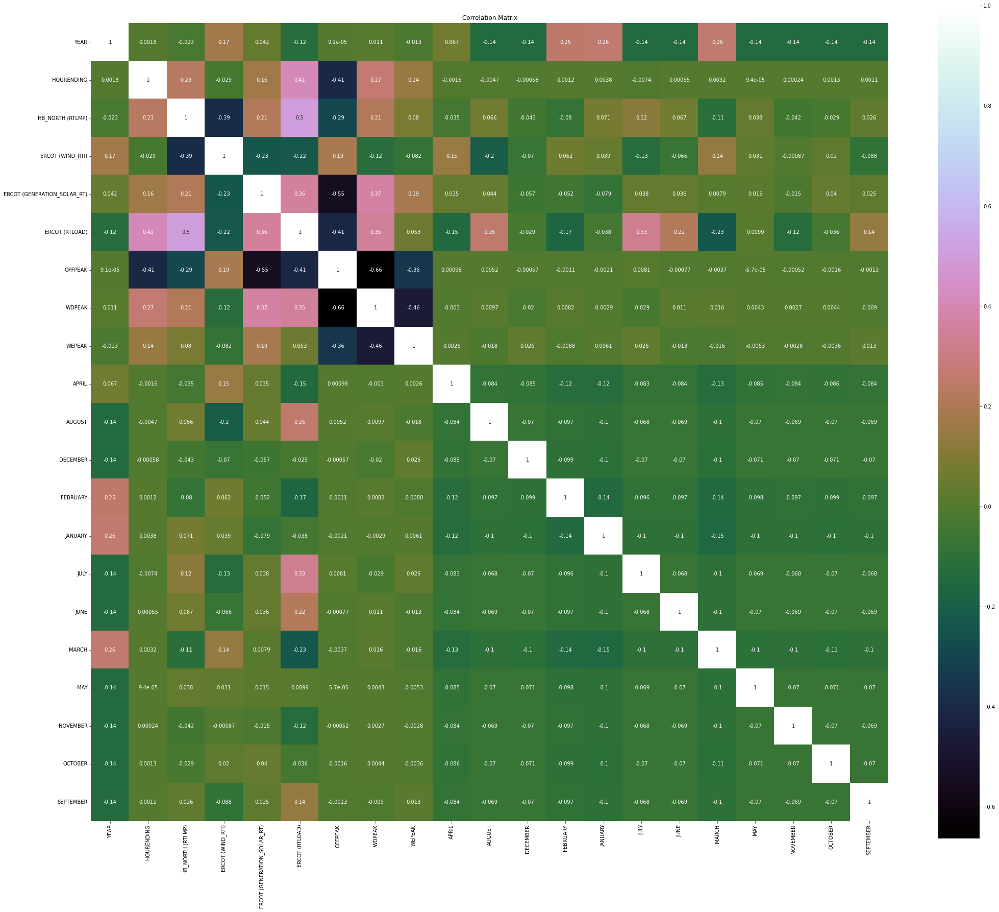

In [35]:
#Taking a final look at the correlation matrix.
plt.figure(figsize=(35,30))
plt.title("Correlation Matrix")
sns.heatmap(df_for_train.corr(), vmax=1, square=True,annot=True,cmap='cubehelix');

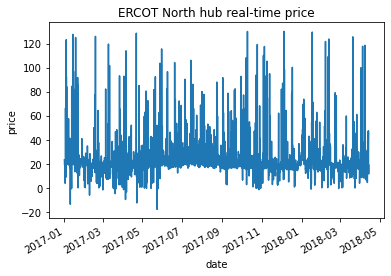

In [36]:
#Taking a look again at RTLMP after removing some extreme values.
plt.plot(pd.to_datetime(df_for_train['DATETIME']), df_for_train['HB_NORTH (RTLMP)'])
plt.gcf().autofmt_xdate()
plt.title('ERCOT North hub real-time price')
plt.xlabel('date')
plt.ylabel('price');

In [37]:
#This part reorders the columns.
column_names = ['HB_NORTH (RTLMP)', 'DATETIME', 'YEAR', 'HOURENDING', 'MARKETDAY', 'ERCOT (WIND_RTI)',\
       'ERCOT (GENERATION_SOLAR_RT)', 'ERCOT (RTLOAD)', 'OFFPEAK', 'WDPEAK',\
       'WEPEAK', 'JANUARY','FEBRUARY','MARCH', 'APRIL', 'MAY','JUNE','JULY',\
                'AUGUST', 'SEPTEMBER', 'OCTOBER', 'NOVEMBER','DECEMBER']
df_for_train = df_for_train[column_names]

In [38]:
#Separate the train dataframe into X_train and y_train.
y_train = df_for_train.pop('HB_NORTH (RTLMP)')
X_train = df_for_train.loc[:,~df_for_train.columns.isin(['DATETIME', 'YEAR', 'MARKETDAY'])]

In [39]:
index_lst = [i for i in range(len(df_for_test))]
df_for_test.index = index_lst

In [40]:
#For train split, there are 2 nan values at the last 2 indicies. The last 2 rows are dropped for validation.  
print(df_for_test.loc[pd.isna(df_for_test["ERCOT (WIND_RTI)"]), :].index)

Int64Index([3745, 3746], dtype='int64')


In [41]:
df_for_test.iloc[:3745,:].isna().any()

DATETIME                       False
HB_NORTH (RTLMP)               False
ERCOT (WIND_RTI)               False
ERCOT (GENERATION_SOLAR_RT)    False
ERCOT (RTLOAD)                 False
HOURENDING                     False
MARKETDAY                      False
PEAKTYPE                       False
MONTH                          False
YEAR                           False
dtype: bool

In [42]:
#Performing the same preprocessing practices on the test split to make sure X_train, X_test have the same number of features.
df_for_test = df_for_test.iloc[:3745,:]
peaktype_array = ohe.fit_transform(df_for_test[['PEAKTYPE']]).toarray()
peaktype_labels = np.array(ohe.categories_).ravel()
peaktypes = pd.DataFrame(peaktype_array, columns=peaktype_labels)
df_for_test = pd.concat((df_for_test, peaktypes), axis=1).drop(["PEAKTYPE"], axis=1)
month_array = ohe.fit_transform(df_for_test[['MONTH']]).toarray()
month_labels = np.array(ohe.categories_).ravel()
month_types = pd.DataFrame(month_array, columns=month_labels)
df_for_test = pd.concat((df_for_test, month_types), axis=1).drop(["MONTH"], axis=1)

In [43]:
#Some months in test split are not present. This part adds them to make sure X_train, X_test have the same number of features.
months_test = pd.DataFrame(np.zeros((3745,6)), columns = ['JANUARY', "FEBRUARY", "MARCH", "OCTOBER", "NOVEMBER", "DECEMBER" ])
df_for_test = pd.concat((df_for_test, months_test), axis=1)

In [44]:
df_for_test = df_for_test[column_names]
y_test = df_for_test.pop('HB_NORTH (RTLMP)')
X_test = df_for_test.loc[:,~df_for_train.columns.isin(['DATETIME', 'YEAR', 'MARKETDAY'])]

In [145]:
#Before the model starts learning, X_train_model and y_train_model are there to store the data. n_past essentially means the look back period, n_future means number of future days to 
#predict. In this case, a 7-day lookback window and a 1-day prediction is used. The X_train_model will keep appending 2-dimensional data (past 7 day observations) as the loop goes on.
#Therefore, X_train_model will be 3 dimensional. y_train will keep appending RTLMP 1-day ahead of the 7 day obervations for the model to learn. 
X_train_model = []
y_train_model = []
n_future = 1
n_past = 120 
for i in range(n_past,len(X_train)-n_future+1):
    y_train_model.append(y_train[i + n_future - 1:i + n_future]) 

scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
for i in range(n_past, len(X_train_scaled) - n_future +1):
    X_train_model.append(X_train_scaled[i - n_past:i,:]) 
X_train_model, y_train_model = np.array(X_train_model), np.array(y_train_model).flatten()

X_test_model = []
y_test_model = []
for i in range(n_past,len(X_test)-n_future+1):
    y_test_model.append(y_test[i + n_future - 1:i + n_future])

X_test_scaled = scaler.transform(X_test)
for i in range(n_past, len(X_test_scaled) - n_future +1):
    X_test_model.append(X_test_scaled[i - n_past:i,:]) 
X_test_model, y_test_model = np.array(X_test_model), np.array(y_test_model).flatten()

In [153]:
#Below are implementation of LSTM model.
import tensorflow
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.layers import LSTM
from tensorflow import keras
def create_LSTM(lookback, feature_dim):
    tensorflow.random.set_seed(5)
    model = Sequential()
    model.add(LSTM(64, activation='relu',input_shape=(lookback, feature_dim), return_sequences=True))
    model.add(Dropout(0.2))
    model.add(LSTM(32, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(1, activation = 'relu'))
    model.compile(loss='mean_absolute_error', optimizer='adam')
    return model

In [154]:
path_checkpoint = "model_checkpoint.h1"
es_callback = keras.callbacks.EarlyStopping(monitor="val_loss", min_delta=0, patience=10)

modelckpt_callback = keras.callbacks.ModelCheckpoint(
    monitor="val_loss",
    filepath=path_checkpoint,
    verbose=1,
    save_weights_only=True,
    save_best_only=True,
)
LSTM_model = create_LSTM(X_train_model.shape[1], X_train_model.shape[2])
LSTM_model.fit(X_train_model, y_train_model, epochs=200, batch_size=32, validation_split=0.2,callbacks=[es_callback, modelckpt_callback])
LSTM_pred = LSTM_model.predict(X_test_model) #LSTM_pred provides the predicted RTLMP values.

Epoch 1/200
275/275 [==============================] - ETA: 0s - loss: 21.2208
Epoch 1: val_loss improved from inf to 19.02992, saving model to model_checkpoint.h1
275/275 [==============================] - 41s 138ms/step - loss: 21.2208 - val_loss: 19.0299
Epoch 2/200
275/275 [==============================] - ETA: 0s - loss: 1006353.9375
Epoch 2: val_loss did not improve from 19.02992
275/275 [==============================] - 37s 135ms/step - loss: 1006353.9375 - val_loss: 92.3607
Epoch 3/200
275/275 [==============================] - ETA: 0s - loss: 46.4989
Epoch 3: val_loss did not improve from 19.02992
275/275 [==============================] - 37s 136ms/step - loss: 46.4989 - val_loss: 23.9030
Epoch 4/200
275/275 [==============================] - ETA: 0s - loss: 24.7181
Epoch 4: val_loss did not improve from 19.02992
275/275 [==============================] - 37s 136ms/step - loss: 24.7181 - val_loss: 24.4199
Epoch 5/200
275/275 [==============================] - ETA: 0s - loss

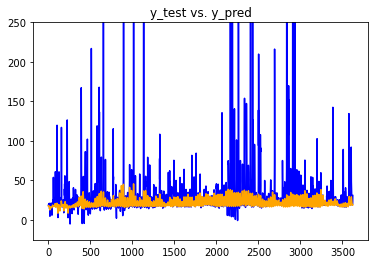

In [160]:
plt.plot(y_test_model, color='b')
plt.plot(LSTM_pred, color='orange')
plt.title('y_test vs. y_pred')
plt.ylim((-25,250));

In [156]:
#Several metrics of the results of the LSTM model are shown below. Since it is hard for time series forecasting to follow closely of the actual test split,
#a low r^2 can be expected. The mean absolute error of 11.9 is achieved while rmse will be larger because the errors are squared.
#Look at the plot, the LSTM model didn't catch some of the price "jumps" as the test split has some RTLMP data with much higher prices.
#For further studies, a hyperparameter tuning can be performed to find the best number of nodes at each layer.
#The lookback period can also be changed to see if there is any improvement for the prediction. But in this case, the learning rate is sometimes too high unless manually set,
#and the loss function tends to rise to nan as the lookback period has more days to learn. 
print("LSTM achieved an r^2 score of {}".format(r2_score(y_test_model,LSTM_pred)))
print("LSTM achieved an MAE of {}".format(mean_absolute_error(y_test_model,LSTM_pred)))
print("LSTM achieved an RMSE of {}".format(np.sqrt(mean_squared_error(y_test_model,LSTM_pred))))


LSTM achieved an r^2 score of 0.017415324595567827
LSTM achieved an MAE of 11.912781750098919
LSTM achieved an RMSE of 69.4279585115512
